In [ ]:
import os
import torch
os.environ['TORCH'] = torch.__version__
print(torch.__version__)

!pip install -q torch-scatter -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q torch-sparse -f https://data.pyg.org/whl/torch-${TORCH}.html
!pip install -q git+https://github.com/pyg-team/pytorch_geometric.git

2.5.0+cu121
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.0/108.0 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.0/210.0 kB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
# Import the NetworkX package
import networkx as nx

import torch
print("PyTorch has version {}".format(torch.__version__))

import torch
from torch.nn import Linear, Dropout
from torch_geometric.nn import GCNConv, GATv2Conv, SAGEConv

import torch.nn.functional as F

from torch_geometric.datasets import KarateClub

%matplotlib inline
import torch
import networkx as nx
import matplotlib.pyplot as plt

from sklearn.manifold import TSNE

from torch.nn import Linear, Sequential, BatchNorm1d, ReLU, Dropout
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, GINConv
from torch_geometric.nn import global_mean_pool, global_add_pool


PyTorch has version 2.5.0+cu121


In [ ]:
# Helper function for visualization.

# Visualization function for NX graph or PyTorch tensor
def visualize(G, h, color, epoch=None, loss=None):
    plt.figure(figsize=(7,7))
    plt.xticks([])
    plt.yticks([])

    if torch.is_tensor(h):
        h = h.detach().cpu().numpy()
        plt.scatter(h[:, 0], h[:, 1], s=140, c=color, cmap="hsv")
        if epoch is not None and loss is not None:
            plt.xlabel(f'Epoch: {epoch}, Loss: {loss.item():.4f}', fontsize=16)
    else:
        nx.draw_networkx(G, pos=nx.spring_layout(G, seed=42), with_labels=True,
                         node_color=color, cmap="hsv")
    plt.show()

## Dataset

In [ ]:
dataset = KarateClub()
print(f'Dataset: {dataset}:')
print('======================')
print(f'Number of graphs: {len(dataset)}')
print(f'Number of nodes: {dataset[0].x.shape[0]}')
print(f'Number of features: {dataset.num_features}')
print(f'Number of classes: {dataset.num_classes}')

Dataset: KarateClub():
Number of graphs: 1
Number of nodes: 34
Number of features: 34
Number of classes: 4


In [ ]:
data = dataset[0]  # Get the first graph object.

print(data)
print('==============================================================')

# Gather some statistics about the graph.
print(f'Number of nodes: {data.num_nodes}')
print(f'Number of edges: {data.num_edges}')
print(f'Average node degree: {data.num_edges / data.num_nodes:.2f}')
print(f'Number of training nodes: {data.train_mask.sum()}')
print(f'Training node label rate: {int(data.train_mask.sum()) / data.num_nodes:.2f}')
print(f'Contains isolated nodes: {data.has_isolated_nodes()}')
print(f'Contains self-loops: {data.has_self_loops()}')
print(f'Is undirected: {data.is_undirected()}')

Data(x=[34, 34], edge_index=[2, 156], y=[34], train_mask=[34])
Number of nodes: 34
Number of edges: 156
Average node degree: 4.59
Number of training nodes: 4
Training node label rate: 0.12
Contains isolated nodes: False
Contains self-loops: False
Is undirected: True


In [ ]:
print(data.x.shape)
data.x

torch.Size([34, 34])


tensor([[1., 0., 0.,  ..., 0., 0., 0.],
        [0., 1., 0.,  ..., 0., 0., 0.],
        [0., 0., 1.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 1., 0., 0.],
        [0., 0., 0.,  ..., 0., 1., 0.],
        [0., 0., 0.,  ..., 0., 0., 1.]])

In [ ]:
print(data.y.shape)
data.y

torch.Size([34])


tensor([1, 1, 1, 1, 3, 3, 3, 1, 0, 1, 3, 1, 1, 1, 0, 0, 3, 1, 0, 1, 0, 1, 0, 0,
        2, 2, 0, 0, 2, 0, 0, 2, 0, 0])

In [ ]:
print(data.edge_index.shape)
data.edge_index

torch.Size([2, 156])


tensor([[ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,
          1,  1,  1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  3,
          3,  3,  3,  3,  3,  4,  4,  4,  5,  5,  5,  5,  6,  6,  6,  6,  7,  7,
          7,  7,  8,  8,  8,  8,  8,  9,  9, 10, 10, 10, 11, 12, 12, 13, 13, 13,
         13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18, 18, 19, 19, 19, 20, 20, 21,
         21, 22, 22, 23, 23, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 27, 27,
         27, 27, 28, 28, 28, 29, 29, 29, 29, 30, 30, 30, 30, 31, 31, 31, 31, 31,
         31, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 32, 33, 33, 33, 33, 33,
         33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33],
        [ 1,  2,  3,  4,  5,  6,  7,  8, 10, 11, 12, 13, 17, 19, 21, 31,  0,  2,
          3,  7, 13, 17, 19, 21, 30,  0,  1,  3,  7,  8,  9, 13, 27, 28, 32,  0,
          1,  2,  7, 12, 13,  0,  6, 10,  0,  6, 10, 16,  0,  4,  5, 16,  0,  1,
          2,  3,  0,  2, 30, 32, 33,  2, 33,  0,  4

In [ ]:
data.edge_index.t()

tensor([[ 0,  1],
        [ 0,  2],
        [ 0,  3],
        [ 0,  4],
        [ 0,  5],
        [ 0,  6],
        [ 0,  7],
        [ 0,  8],
        [ 0, 10],
        [ 0, 11],
        [ 0, 12],
        [ 0, 13],
        [ 0, 17],
        [ 0, 19],
        [ 0, 21],
        [ 0, 31],
        [ 1,  0],
        [ 1,  2],
        [ 1,  3],
        [ 1,  7],
        [ 1, 13],
        [ 1, 17],
        [ 1, 19],
        [ 1, 21],
        [ 1, 30],
        [ 2,  0],
        [ 2,  1],
        [ 2,  3],
        [ 2,  7],
        [ 2,  8],
        [ 2,  9],
        [ 2, 13],
        [ 2, 27],
        [ 2, 28],
        [ 2, 32],
        [ 3,  0],
        [ 3,  1],
        [ 3,  2],
        [ 3,  7],
        [ 3, 12],
        [ 3, 13],
        [ 4,  0],
        [ 4,  6],
        [ 4, 10],
        [ 5,  0],
        [ 5,  6],
        [ 5, 10],
        [ 5, 16],
        [ 6,  0],
        [ 6,  4],
        [ 6,  5],
        [ 6, 16],
        [ 7,  0],
        [ 7,  1],
        [ 7,  2],
        [ 

In [ ]:
print(data.train_mask.shape)
data.train_mask

torch.Size([34])


tensor([ True, False, False, False,  True, False, False, False,  True, False,
        False, False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True, False, False, False, False, False,
        False, False, False, False])

In [ ]:
# The adjacency matrix can be inferred from the edge_index with a utility function.

from torch_geometric.utils import to_dense_adj

A = to_dense_adj(data.edge_index)[0].numpy().astype(int)
print(f'A = {A.shape}')
print(A)

A = (34, 34)
[[0 1 1 ... 1 0 0]
 [1 0 1 ... 0 0 0]
 [1 1 0 ... 0 1 0]
 ...
 [1 0 0 ... 0 1 1]
 [0 0 1 ... 1 0 1]
 [0 0 0 ... 1 1 0]]


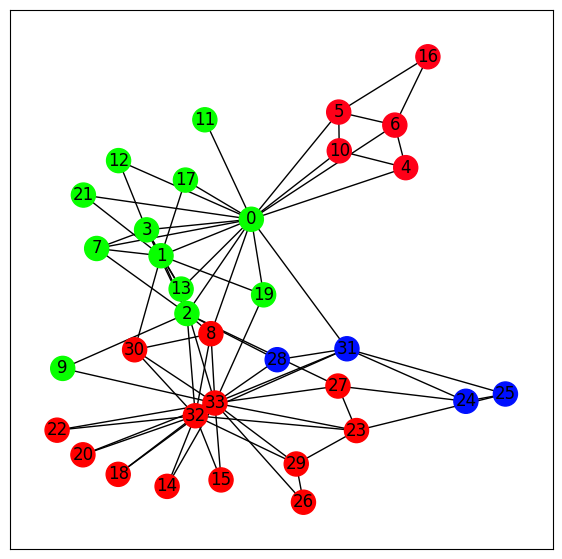

In [ ]:
from torch_geometric.utils import to_networkx

G = to_networkx(data, to_undirected=True)
visualize(G, None, color=data.y)

In [ ]:
print(data)

Data(x=[34, 34], edge_index=[2, 156], y=[34], train_mask=[34])


## Graph Convolutional Network (GCN)

In [ ]:
import torch
torchversion = torch.__version__

from torch.nn import Linear
from torch_geometric.nn import GCNConv

# this for experiments
class GCN(torch.nn.Module):
    def __init__(self, num_features, dim_h, num_classes):
        super(GCN, self).__init__()
        torch.manual_seed(42)
        self.conv1 = GCNConv(num_features, dim_h)
        self.conv2 = GCNConv(dim_h, dim_h)
        self.classifier = Linear(dim_h, num_classes)

    def forward(self, x, edge_index):
        # Node embeddings
        h = self.conv1(x, edge_index)
        h = h.relu()
        h = self.conv2(h, edge_index)
        h = h.relu()  # final GNN embedding space.

        # Apply a final (linear) classifier.
        out = self.classifier(h)

        return out, h

model = GCN(num_features=dataset.num_features, dim_h=3, num_classes=dataset.num_classes)
print(model)

GCN(
  (conv1): GCNConv(34, 3)
  (conv2): GCNConv(3, 3)
  (classifier): Linear(in_features=3, out_features=4, bias=True)
)


In [ ]:
# Train

criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# Calculate accuracy
def accuracy(pred_y, y):
    return (pred_y == y).sum() / len(y)

# Data for animations
embeddings = []
losses = []
accuracies = []
outputs = []
epochs = range(1, 201)

# Training loop
for epoch in epochs:
    # Clear gradients
    optimizer.zero_grad()

    # Forward pass
    z, h = model(data.x, data.edge_index)

    # Calculate loss function
    loss = criterion(z, data.y)

    # Calculate accuracy
    acc = accuracy(z.argmax(dim=1), data.y)

    # Compute gradients
    loss.backward()

    # Tune parameters
    optimizer.step()

    # Store data for animations
    embeddings.append(h)
    losses.append(loss)
    accuracies.append(acc)
    outputs.append(z.argmax(dim=1))

    # Print metrics every 10 epochs
    if epoch % 10 == 0:
        print(f'Epoch {epoch:>3} | Loss: {loss:.2f} | Acc: {acc*100:.2f}%')

Epoch  10 | Loss: 1.29 | Acc: 38.24%
Epoch  20 | Loss: 1.26 | Acc: 38.24%
Epoch  30 | Loss: 1.23 | Acc: 64.71%
Epoch  40 | Loss: 1.19 | Acc: 70.59%
Epoch  50 | Loss: 1.11 | Acc: 70.59%
Epoch  60 | Loss: 0.97 | Acc: 73.53%
Epoch  70 | Loss: 0.84 | Acc: 73.53%
Epoch  80 | Loss: 0.76 | Acc: 73.53%
Epoch  90 | Loss: 0.71 | Acc: 73.53%
Epoch 100 | Loss: 0.68 | Acc: 73.53%
Epoch 110 | Loss: 0.66 | Acc: 73.53%
Epoch 120 | Loss: 0.63 | Acc: 73.53%
Epoch 130 | Loss: 0.58 | Acc: 82.35%
Epoch 140 | Loss: 0.48 | Acc: 88.24%
Epoch 150 | Loss: 0.41 | Acc: 88.24%
Epoch 160 | Loss: 0.36 | Acc: 88.24%
Epoch 170 | Loss: 0.34 | Acc: 88.24%
Epoch 180 | Loss: 0.33 | Acc: 88.24%
Epoch 190 | Loss: 0.32 | Acc: 88.24%
Epoch 200 | Loss: 0.32 | Acc: 88.24%


In [ ]:
# get node embeddings
model.eval()

_, h = model(data.x, data.edge_index)
print(h.shape)
h

torch.Size([34, 3])


tensor([[4.7268e+00, 2.2118e+00, 1.3476e-01],
        [3.0139e+00, 9.4059e-01, 0.0000e+00],
        [2.2510e+00, 4.4328e-01, 0.0000e+00],
        [3.0061e+00, 1.3655e+00, 0.0000e+00],
        [3.9473e+00, 3.5036e+00, 3.3312e+00],
        [4.7030e+00, 4.1247e+00, 4.0689e+00],
        [4.6855e+00, 4.1108e+00, 4.0526e+00],
        [2.6075e+00, 1.4166e+00, 1.4697e-01],
        [9.4037e-02, 0.0000e+00, 0.0000e+00],
        [1.4415e+00, 8.7221e-01, 0.0000e+00],
        [3.9818e+00, 3.5311e+00, 3.3634e+00],
        [1.9977e+00, 1.2370e+00, 4.1055e-03],
        [2.3148e+00, 1.3047e+00, 6.7130e-02],
        [2.1331e+00, 9.7115e-01, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00],
        [4.1760e+00, 3.8464e+00, 3.8403e+00],
        [2.1947e+00, 1.1934e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00],
        [1.7518e+00, 8.9992e-01, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00],
        [2.1773e+00, 1.2229e+00, 0

In [ ]:
# Display

from IPython import display

def plot_embedding_3d(h):
    if torch.is_tensor(h):
        embed = h.detach().cpu().numpy()
    else:
        embed = h

    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(projection='3d')
    ax.patch.set_alpha(0)
    plt.tick_params(left=False,
                    bottom=False,
                    labelleft=False,
                    labelbottom=False)
    ax.scatter(embed[:, 0], embed[:, 1], embed[:, 2],
            s=200, c=data.y, cmap="hsv", vmin=-2, vmax=3)

    plt.show()

In [ ]:
# plot_embedding_3d(h)

In [ ]:
%%capture
import numpy as np

from IPython.display import HTML
from matplotlib import animation
plt.rcParams["animation.bitrate"] = 3000

def animate(i):
    embed = embeddings[i].detach().cpu().numpy()
    ax.clear()
    ax.scatter(embed[:, 0], embed[:, 1], embed[:, 2],
           s=200, c=data.y, cmap="hsv", vmin=-2, vmax=3)
    plt.title(f'Epoch: {i + 1} | Loss: {losses[i]:.2f}',
              fontsize=18, pad=40)

fig = plt.figure(figsize=(10, 10))
plt.axis('off')
ax = fig.add_subplot(projection='3d')
plt.tick_params(left=False,
                bottom=False,
                labelleft=False,
                labelbottom=False)

anim = animation.FuncAnimation(fig, animate, \
              np.arange(0, 200, 1), interval=100, repeat=False)
html = HTML(anim.to_html5_video())

In [ ]:
display.display(html)